In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import anndata
import scipy

import os

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

from tqdm import tqdm

In [2]:
import session_info
session_info.show()

In [3]:
sc.settings.set_figure_params(dpi=120)

In [4]:
import importlib.util
import sys
spec = importlib.util.spec_from_file_location("module.name", "/rfs/project/rfs-iCNyzSAaucw/kk837/function/python/utils.py")
utils = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = utils
spec.loader.exec_module(utils)

# Variables

In [5]:
data_object_dir = '/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/VisiumHD/Revision_Oct2025'

In [6]:
latent_space_condition = 'n-layers-3'
latent_space = f'scVI_latent_{latent_space_condition}'
embedding_basis = f'X_umap_scVI_{latent_space_condition}'

# Read in original adata

In [7]:
%%time
adata = sc.read_h5ad(f'{data_object_dir}/epicardium-mixture_b2c_cells_filtered_raw.h5ad')
adata

CPU times: user 137 ms, sys: 1.72 s, total: 1.86 s
Wall time: 31.1 s


AnnData object with n_obs × n_vars = 45632 × 18085
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'in_tissue_manual', 'library', 'donor_section_ID', 'per-frame_donorIDs', 'donor', 'CS', 'est_CS', 'GA', 'PCW', 'section_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_donor', 'n_genes', 'coarse_grain_pre', 'scVI_latent_n-layers-3_leiden_0.2', 'scVI_latent_n-layers-3_leiden_0.3', 'scVI_latent_n-layers-3_leiden_0.4', 'scVI_latent_n-layers-3_leiden_0.5', 'scVI_latent_n-layers-3_leiden_0.8', 'scVI_latent_n-layers-3_leiden_1.0', 'scVI_latent_n-layers-3_leiden_1.5', 'scVI_latent_n-layers-3_leiden_2.0', 'scVI_latent_n-layers-3_leiden_3.0', 'scVI_latent_n-layers-3_leiden_4.0'
    var: 'gene_ids', 'feature_types', 'genome', 'mt',

In [8]:
sc.pp.neighbors(adata, use_rep=f'scVI_latent_{latent_space_condition}',n_neighbors=15)
sc.tl.umap(adata, min_dist=0.2, spread=1.0)# 
adata.obsm[embedding_basis] = adata.obsm['X_umap'].copy()
del adata.obsm['X_umap']

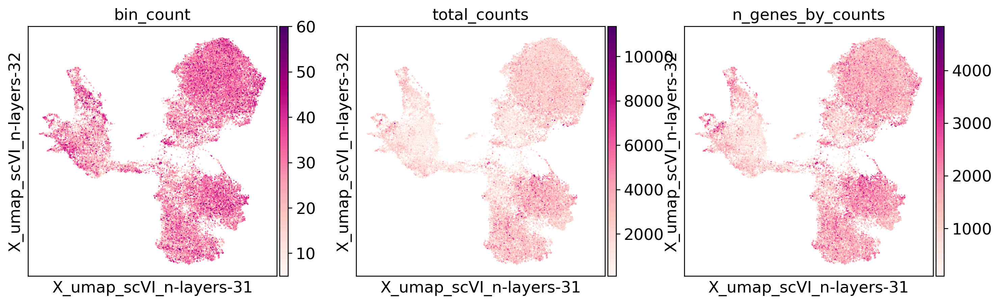

In [9]:
sc.pl.embedding(adata, basis=embedding_basis,
                color=['bin_count','total_counts','n_genes_by_counts'], 
           size=5, wspace=0.2, ncols=6, cmap='RdPu')

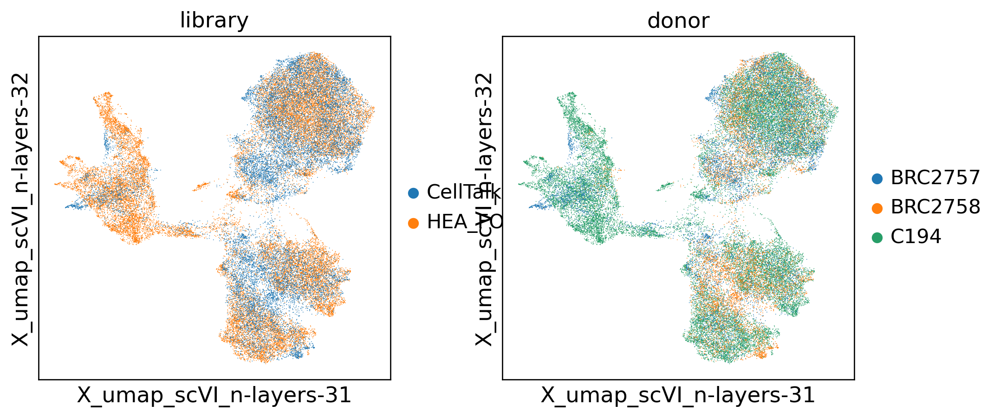

In [10]:
sc.pl.embedding(adata, basis=embedding_basis,
                color=['library','donor'], 
           size=1, wspace=0.2, ncols=6, components='all',cmap='RdPu')

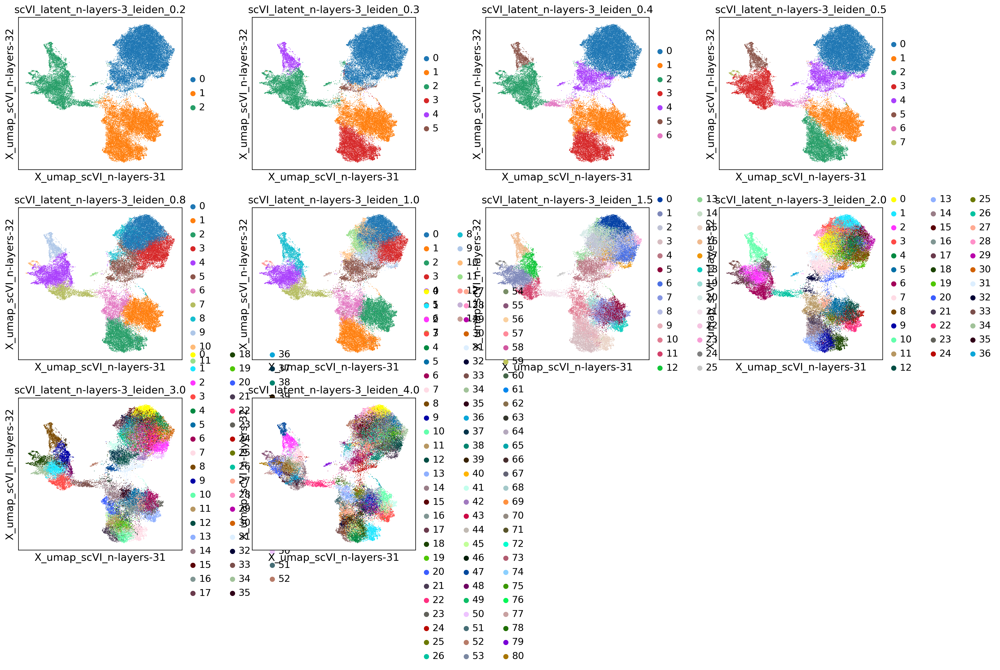

In [11]:
leiden_keys=[]
for res in [0.2,0.3,0.4,0.5,0.8,1.0,1.5,2.0,3.0,4.0]:
    leiden_key = f"leiden_{res}"
    key_added=f"scVI_latent_n-layers-3_{leiden_key}"
    leiden_keys.append(key_added)

sc.pl.embedding(adata,basis=embedding_basis,
                color=leiden_keys,wspace=0.3,ncols=4)

# Log-normalisation

In [12]:
adata_lognorm = adata.copy()

sc.pp.filter_genes(adata_lognorm, min_cells=3)
print(adata_lognorm.shape)

sc.pp.normalize_total(adata_lognorm, target_sum=1e4)
sc.pp.log1p(adata_lognorm)
print(adata_lognorm.X.data[:5])

(45632, 17960)
[1.8897898 1.8897898 1.8897898 1.8897898 1.8897898]


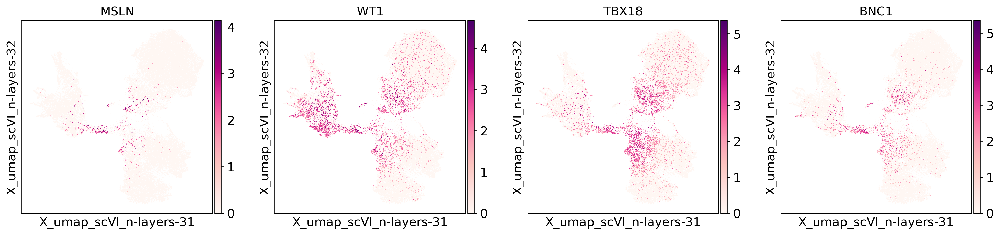

In [13]:
sc.pl.embedding(adata_lognorm,basis=embedding_basis,
                color=['MSLN','WT1','TBX18','BNC1'],cmap='RdPu')

# Checking marker genes

In [14]:
leiden_key_sel = 'scVI_latent_n-layers-3_leiden_2.0'

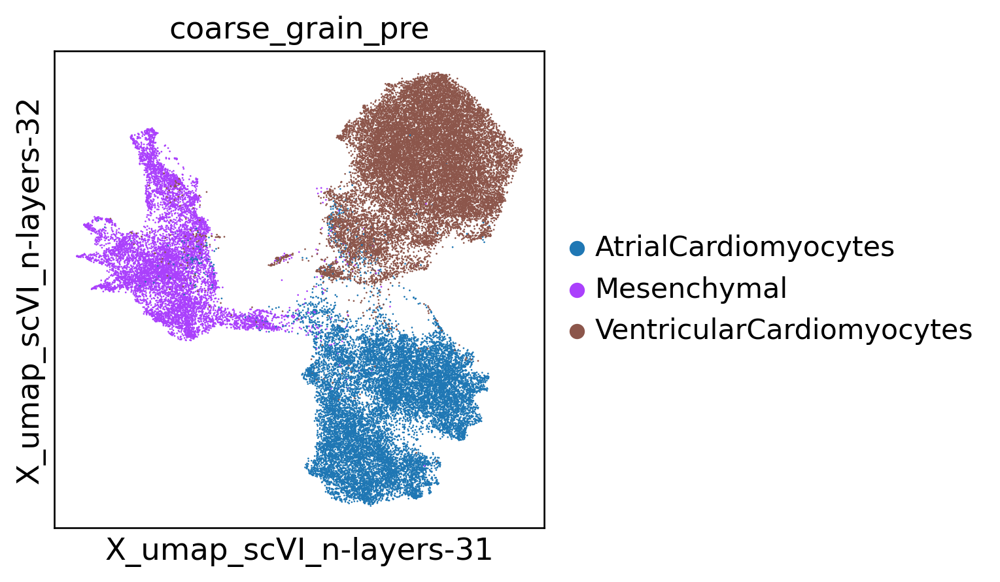

In [20]:
sc.pl.embedding(adata,basis=embedding_basis,
                color='coarse_grain_pre',
                ncols=1)

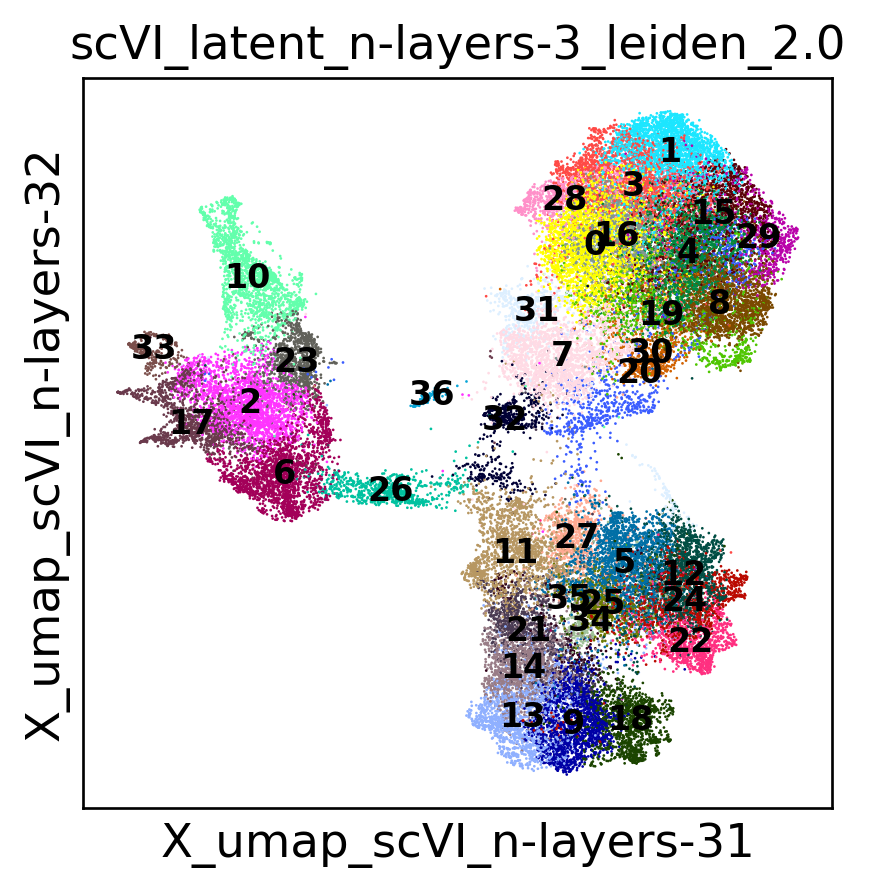

In [15]:
sc.pl.embedding(adata,basis=embedding_basis,
                color=leiden_key_sel,legend_loc='on data',legend_fontsize=10,
                ncols=1)

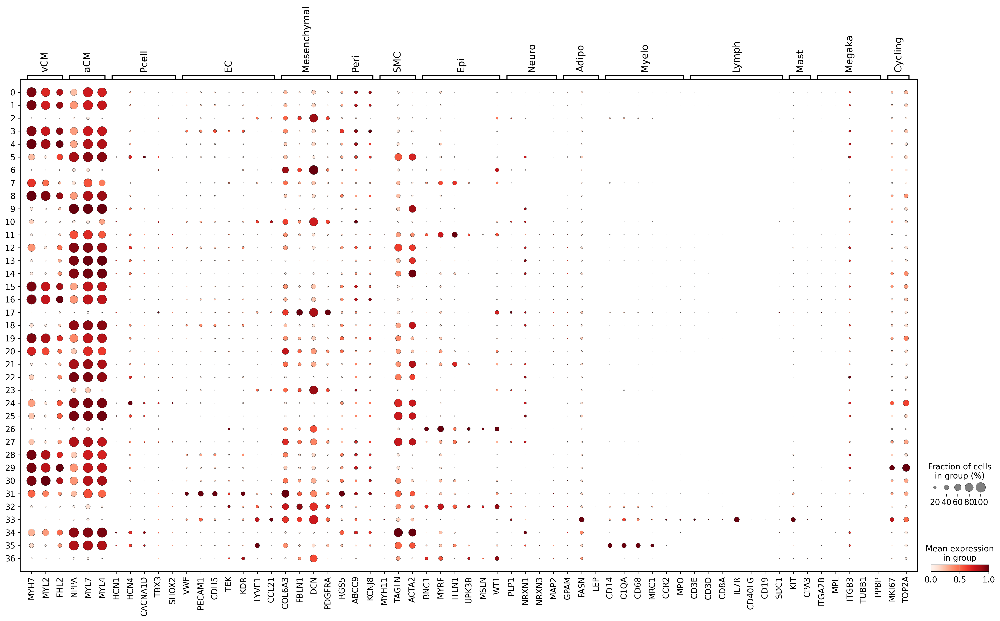

In [16]:
marker_genes_dict = {
    'vCM': ['MYH7', 'MYL2', 'FHL2'],
    'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'Pcell':['HCN1','HCN4','CACNA1D','TBX3','SHOX2'],
    'EC': ['VWF', 'PECAM1', 'CDH5','TEK','KDR','LYVE1','CCL21'],
    'Mesenchymal': ['COL6A3','FBLN1','DCN', 'GCN', 'PDGFRA'],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Epi':['BNC1','MYRF','ITLN1','UPK3B','MSLN','WT1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3',"TUBB3","MAP2"],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68','MRC1','CCR2','MPO'],
    'Lymph': ['CD3E','CD3D','CD8A','IL7R', 'CD40LG','CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3'],
    'Megaka':['ITGA2B','MPL','ITGB3', 'TUBB1', 'PPBP'],
    'Cycling':['MKI67','TOP2A'],
    # 'Mitochondria':['MT-CO1','MT-CO3','MT-CYB','MT-ATP6']
}

for k, v in marker_genes_dict.items():
    marker_genes_dict[k] = [x for x in v if x in adata_lognorm.var_names]

sc.pl.dotplot(adata_lognorm, 
              marker_genes_dict, 
              groupby=leiden_key_sel,
              dendrogram=False,
              standard_scale="var",
              color_map="Reds",
             # swap_axes=True
             )

In [ ]:
# DEG analysis
adata_lognorm.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata_lognorm,groupby=leiden_key_sel)
sc.tl.dendrogram(adata_lognorm, groupby=leiden_key_sel)
dp=sc.pl.rank_genes_groups_dotplot(adata_lognorm, dendrogram=True, standard_scale='var', return_fig=True)
dp.add_totals().show()

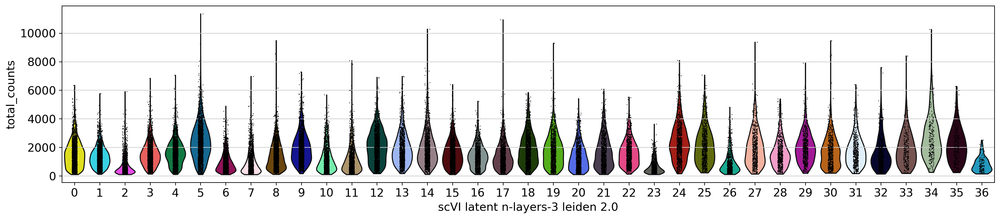

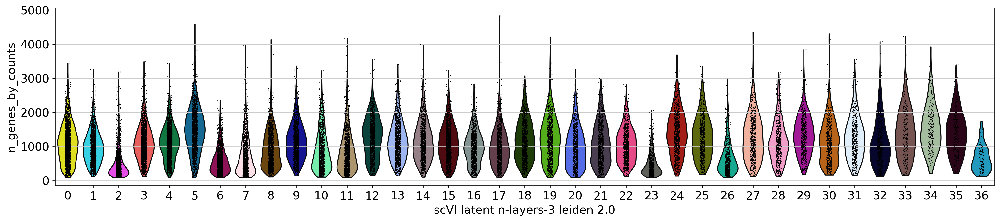

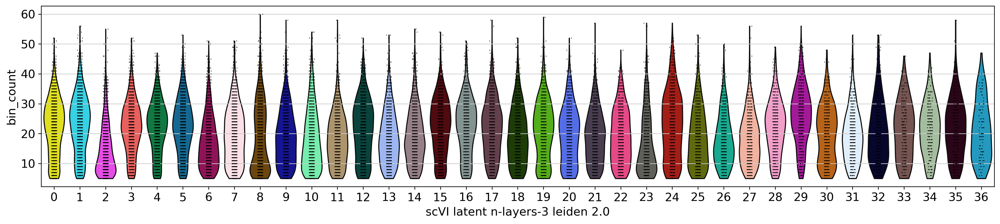

In [18]:
plt.rcParams['figure.figsize'] = 16,4
sc.pl.violin(adata,keys=['total_counts'],groupby=leiden_key_sel)
sc.pl.violin(adata,keys=['n_genes_by_counts'],groupby=leiden_key_sel)
sc.pl.violin(adata,keys=['bin_count'],groupby=leiden_key_sel)

sc.settings.set_figure_params(dpi=120)

In [19]:
df = adata.obs[[leiden_key_sel,'total_counts','n_genes_by_counts','bin_count']].groupby(leiden_key_sel).mean()
df.sort_values('n_genes_by_counts')[:50]

,total_counts,n_genes_by_counts,bin_count
scVI_latent_n-layers-3_leiden_2.0,,,
2,637.320923,472.376330,14.959220
23,635.165771,482.406086,16.790136
6,914.402893,599.786263,17.123014
36,804.441833,651.372093,20.992248
26,883.972351,684.019337,18.066298
7,927.220093,722.465562,19.545831
11,1137.821167,850.074359,18.256410
10,1180.829224,882.343240,18.321096
8,1393.496948,936.992908,18.866339


# Annotate

In [21]:
# Annotate and make a new column
adata_lognorm.obs['coarse_grain_pre'] = adata_lognorm.obs[leiden_key_sel].copy()
adata_lognorm.obs['coarse_grain_pre'] = adata_lognorm.obs['coarse_grain_pre'].astype('str')
adata_lognorm.obs.replace({'coarse_grain_pre': {
    '0': 'VentricularCardiomyocytes', 
    '1': 'VentricularCardiomyocytes',
    '2': 'Mesenchymal',
    '3': 'VentricularCardiomyocytes',
    '4': 'VentricularCardiomyocytes',
    '5': 'AtrialCardiomyocytes',
    '6': 'Mesenchymal',
    '7': 'unclassified_mixture_vCM-epicardium',
    '8': 'VentricularCardiomyocytes',
    '9': 'AtrialCardiomyocytes',
    '10': 'unclassified_mixture',
    '11': 'unclassified_mixture_aCM-epicardium',
    '12': 'AtrialCardiomyocytes',
    '13': 'AtrialCardiomyocytes',
    '14': 'AtrialCardiomyocytes',
    '15': 'VentricularCardiomyocytes',
    '16': 'VentricularCardiomyocytes',
    '17': 'Mesenchymal',
    '18': 'AtrialCardiomyocytes',
    '19': 'VentricularCardiomyocytes',
    '20': 'VentricularCardiomyocytes',
    '21': 'unclassified_mixture_aCM-epicardium',
    '22': 'AtrialCardiomyocytes',
    '23': 'Mesenchymal',
    '24': 'AtrialCardiomyocytes',
    '25': 'AtrialCardiomyocytes',
    '26': 'EpicardialCells',
    '27': 'unclassified_mixture',
    '28': 'VentricularCardiomyocytes',
    '29': 'VentricularCardiomyocytes',
    '30': 'VentricularCardiomyocytes',
    '31': 'unclassified_mixture',
    '32': 'EpicardialCells',
    '33': 'unclassified_mixture_Mesenchymal-LEC-Immune',
    '34': 'AtrialCardiomyocytes',
    '35': 'unclassified_mixture_aCM-Myeloid',
    '36': 'EpicardialCells'
}}, inplace=True)
adata_lognorm.obs['coarse_grain_pre'].value_counts()

coarse_grain_pre
VentricularCardiomyocytes                      17719
AtrialCardiomyocytes                           12062
Mesenchymal                                     6398
unclassified_mixture                            3030
unclassified_mixture_aCM-epicardium             2581
unclassified_mixture_vCM-epicardium             1931
EpicardialCells                                 1408
unclassified_mixture_Mesenchymal-LEC-Immune      267
unclassified_mixture_aCM-Myeloid                 236
Name: count, dtype: int64

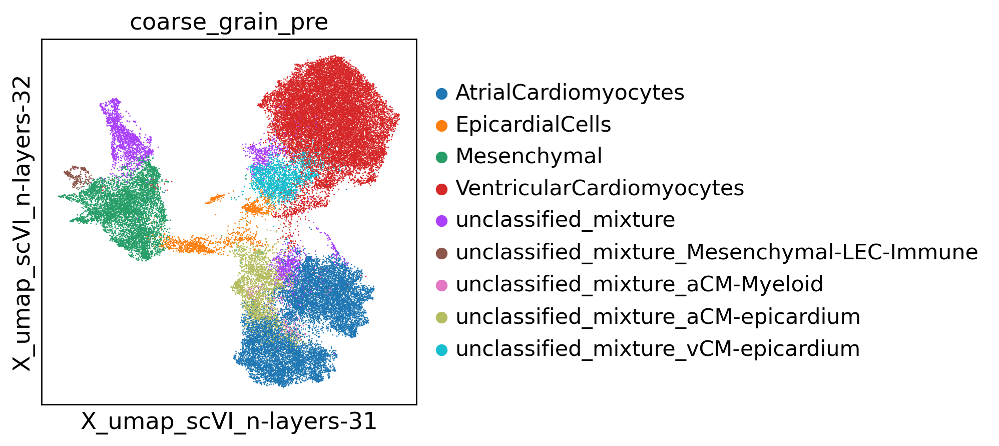

In [22]:
sc.pl.embedding(adata_lognorm,basis=embedding_basis,
                color='coarse_grain_pre',
               )

# Transfer labels to original raw count adata

In [23]:
print(adata.shape)
print(adata_lognorm.shape)

(45632, 18085)
(45632, 17960)


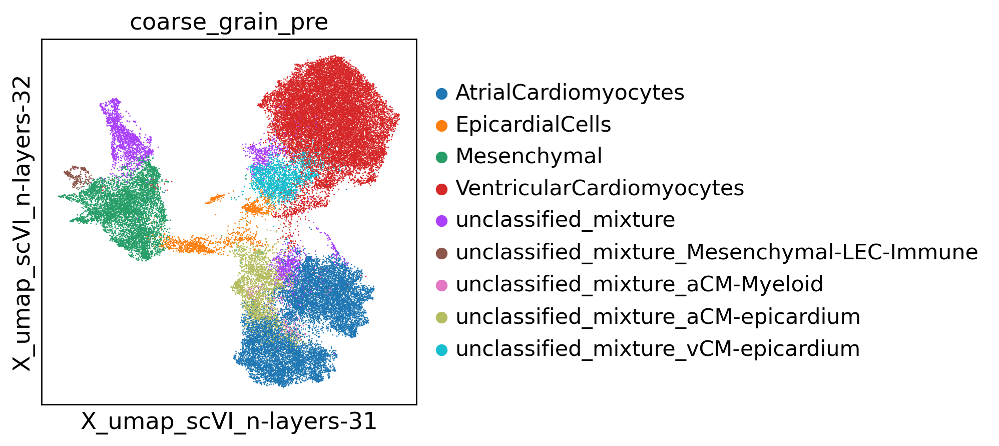

In [24]:
celltype_label = 'coarse_grain_pre'
adata.obs[celltype_label]=adata_lognorm.obs[celltype_label].reindex(adata.obs_names)

sc.pl.embedding(adata,basis=embedding_basis,
                color=celltype_label)

# Save

In [25]:
print(adata.X.data[:10])
adata.write(f'{data_object_dir}/epicardium-mixture_b2c_cells_filtered_raw.h5ad')

[1. 1. 1. 1. 1. 1. 1. 2. 1. 1.]
